In [3]:
from torch.utils.data import DataLoader
import pytorch_lightning as pl
from nuscenes.nuscenes import NuScenes
import numpy as np
from src.utils import vox_utils, data_utils, geom_utils
import hydra
from omegaconf import DictConfig
import matplotlib.pyplot as plt
from src.datamodules.nuscenes_dataset import NuscData, VizData
from src.datamodules.nuscenes_datamodule import NuScenesDataModule


hydra.initialize(config_path="../configs/datamodule")
cfg = hydra.compose(config_name="nuscenes")
# Initialize the NuScenesDataModule with Hydra config
data_module = NuScenesDataModule(
    datasets=cfg.datasets, 
    transforms=cfg.transforms, 
    loaders=cfg.loaders
)

# Prepare data and setup the datamodule
data_module.prepare_data()
data_module.setup(stage='fit')

# Get the train dataloader
train_loader = data_module.train_dataloader()

# Get a batch from the dataloader
batch = next(iter(train_loader))

/data/karthik/bev_perception/src/datamodules/nuscenes_datamodule.py:70: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  @hydra.main(config_path="/data/karthik/bev_perception/configs/datamodule", config_name="nuscenes")
/tmp/ipykernel_48956/597953792.py:13: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  hydra.initialize(config_path="./configs/datamodule")


indices (323, 1)
indices (81, 1)


In [4]:
batch[0].shape

torch.Size([32, 1, 6, 3, 448, 832])

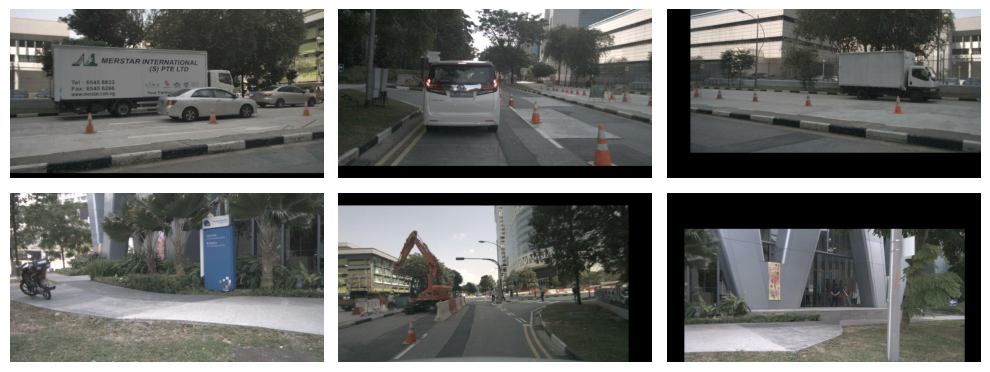

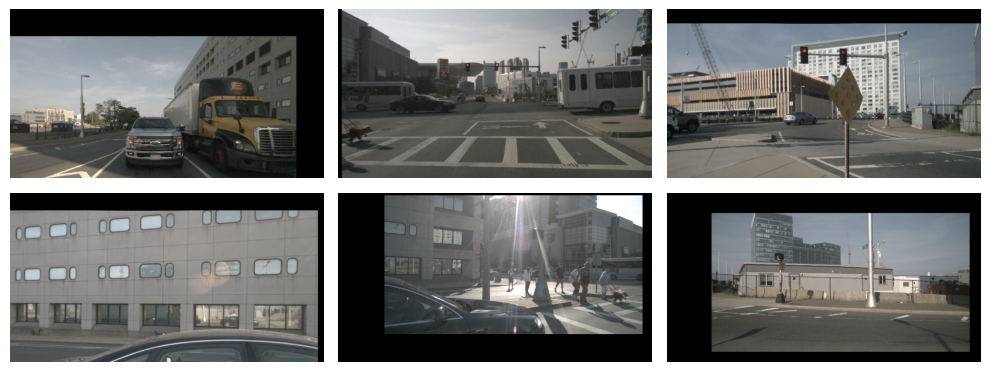

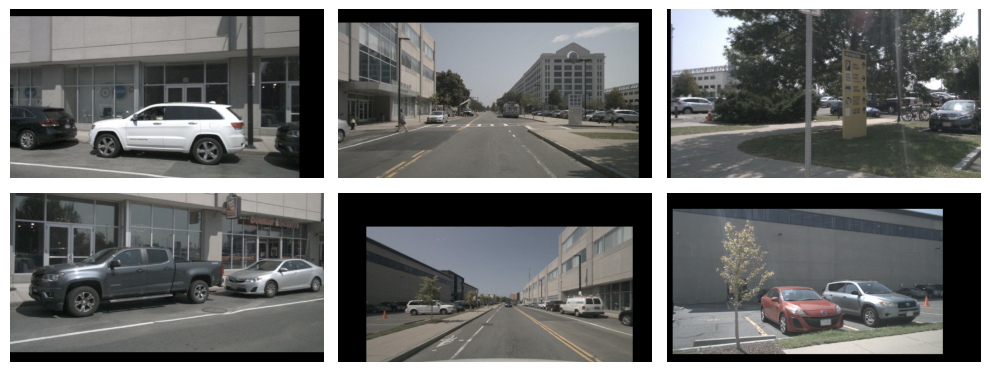

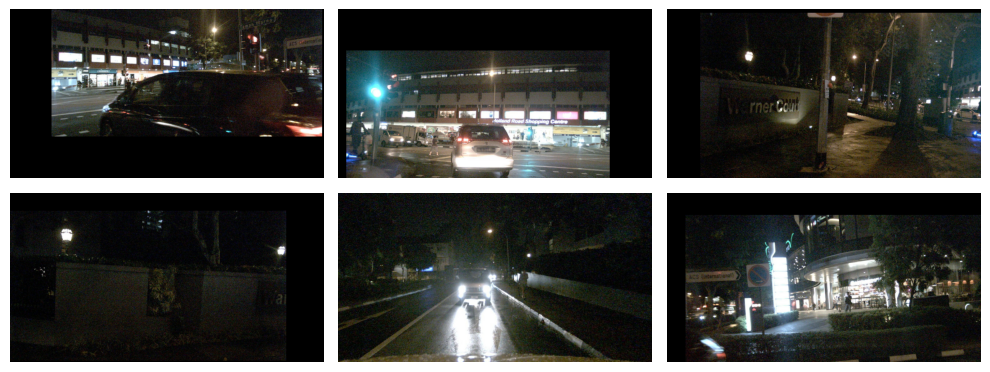

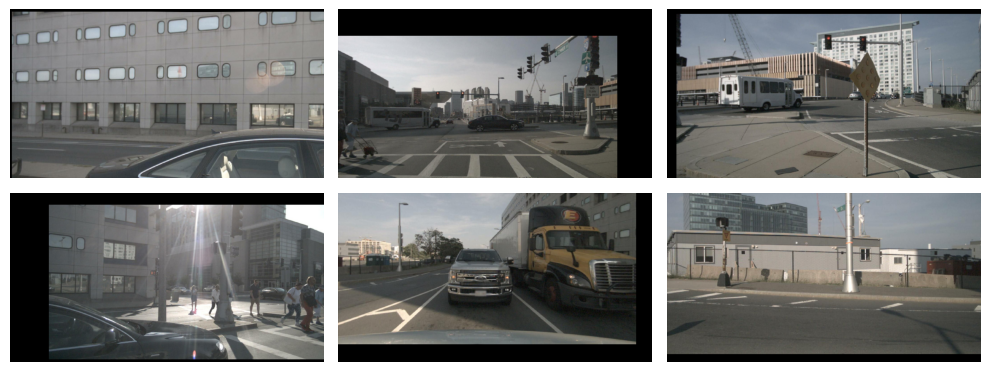

...

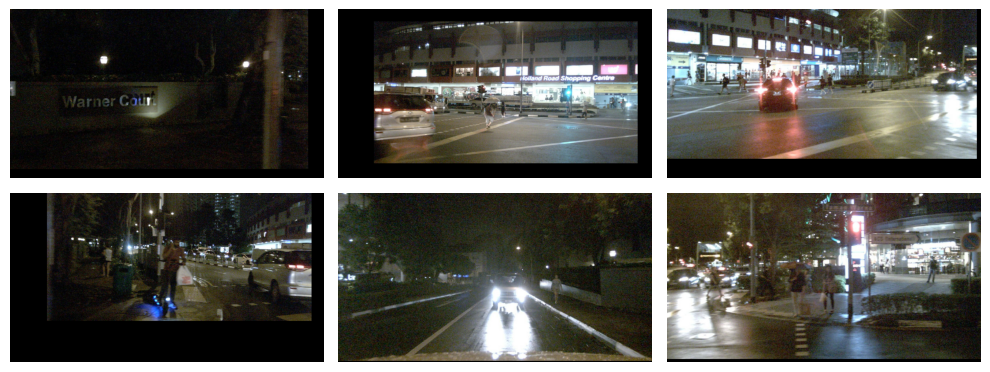

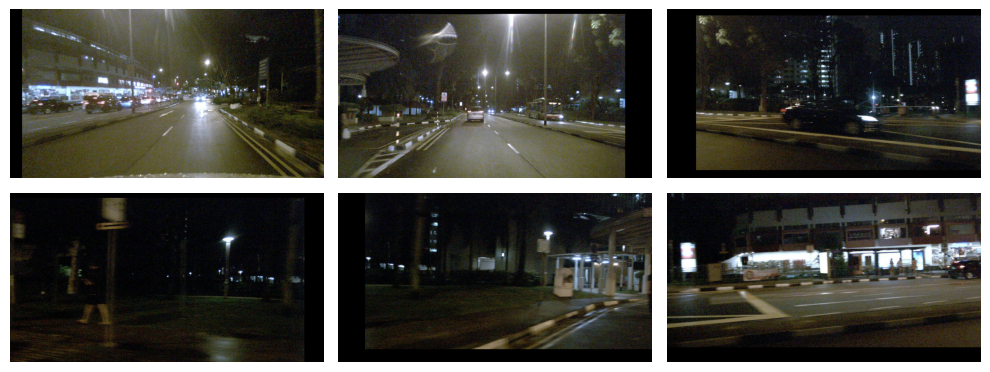

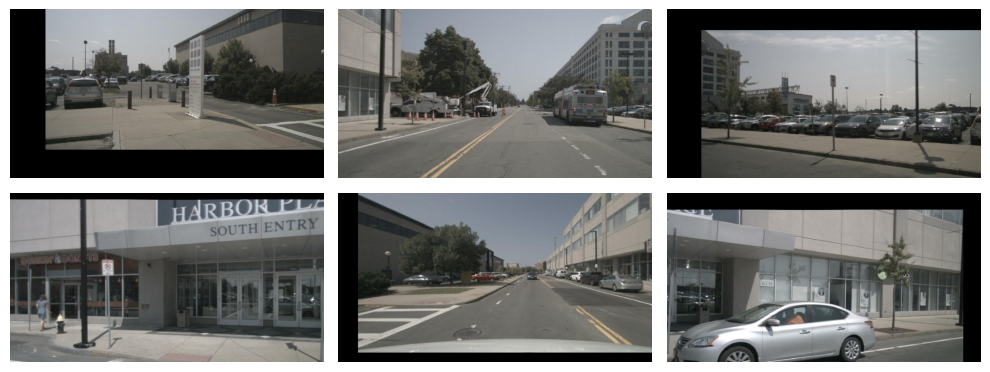

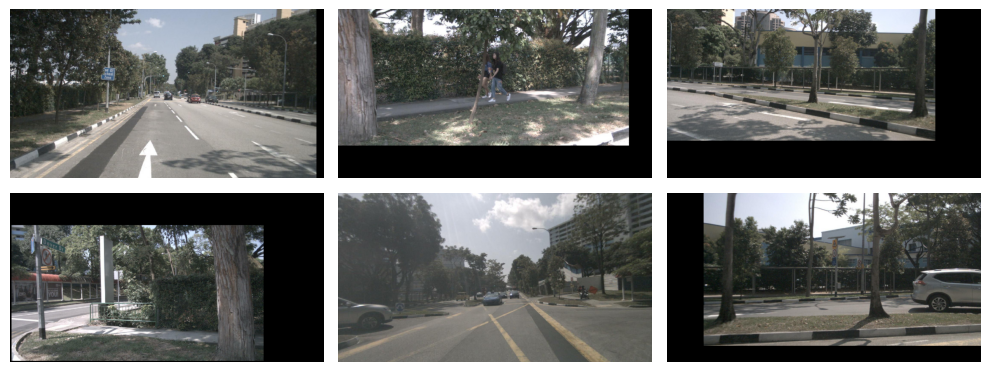

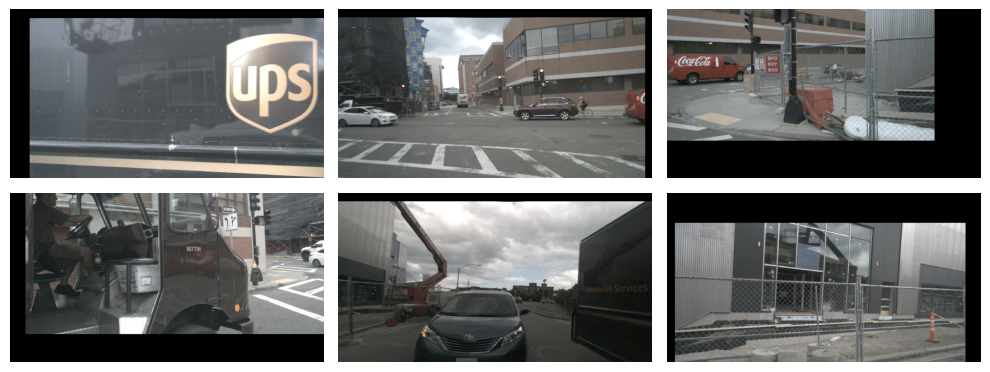

In [40]:
# Assuming the batch contains images as the first element
images = batch[0].squeeze(1)  # Adjust this depending on how the data is returned by the dataloader

# Plot 6 multiple view images


for j in range(20):
    fig, axes = plt.subplots(2, 3, figsize=(10, 4))
    axes = axes.flatten()
    for i in range(6):
        img = images[j, i].permute(1, 2, 0).cpu().numpy()  # Convert to HWC format
        axes[i].imshow(img)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

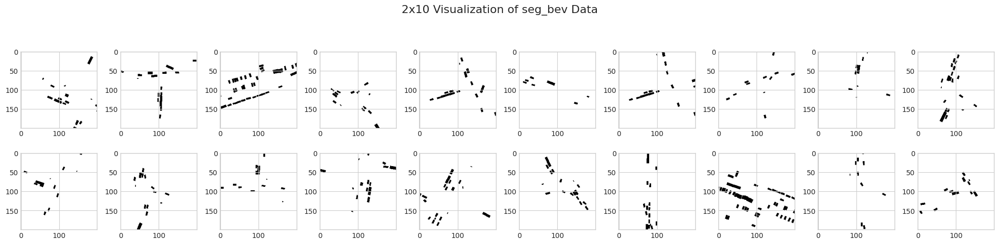

In [41]:
fig, axes = plt.subplots(2, 10, figsize=(20, 5))
fig.suptitle('2x10 Visualization of seg_bev Data', fontsize=16)
#seg_bev = batch[12].squeeze(1)[row*10+col].permute(1, 2, 0).numpy()
for row in range(2):
    for col in range(10):
        ax = axes[row, col]
        ax.imshow(batch[12].squeeze(1)[row*10+col].permute(1, 2, 0).numpy())
        #ax.axis('off')  # Turn off axis for a cleaner look

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
plt.show()

In [44]:
batch[8][:,0].shape

torch.Size([32, 150, 10])

In [48]:
import plotly.graph_objects as go
import numpy as np

# Sample LiDAR points
lidar_points = batch[6].squeeze(1)[10].T.numpy()

fig = go.Figure(data=[go.Scatter3d(
    x=lidar_points[:, 0],
    y=lidar_points[:, 1],
    z=lidar_points[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=lidar_points[:, 2],  # Color by z value
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(scene=dict(
    xaxis_title='X Axis',
    yaxis_title='Y Axis',
    zaxis_title='Z Axis'
), title='3D LiDAR Point Cloud Visualization')

fig.show()

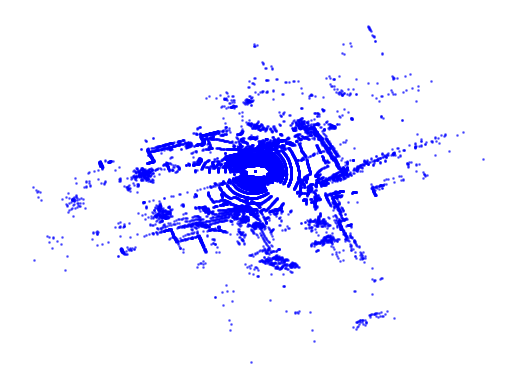

In [59]:
plt.scatter(lidar_points[:, 0], lidar_points[:, 1], c='blue', s=1, alpha=0.5)
plt.axis('off')
plt.show()

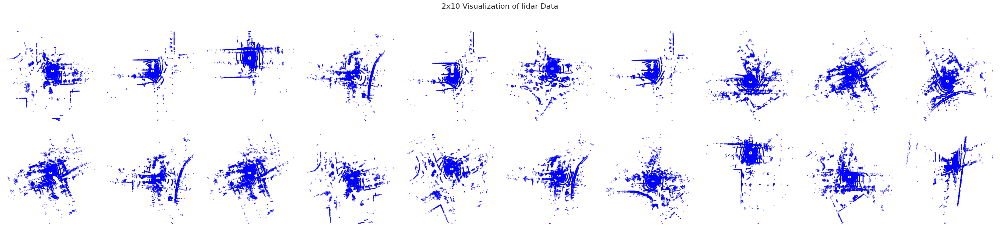

In [63]:
fig, axes = plt.subplots(2, 10, figsize=(30, 7))
fig.suptitle('2x10 Visualization of lidar Data', fontsize=16)
#seg_bev = batch[12].squeeze(1)[row*10+col].permute(1, 2, 0).numpy()
for row in range(2):
    for col in range(10):
        ax = axes[row, col]
        lidar_points = batch[6].squeeze(1)[row*10+col].T.numpy()
        ax.scatter(lidar_points[:, 0], lidar_points[:, 1], c='blue', s=1, alpha=0.5)
        ax.axis('off')  # Turn off axis for a cleaner look

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the title
plt.show()